In [1]:
import import_ipynb
import Scanpy_functions_v03262021 as sc_pipe
import scvelo as scv
scv.logging.print_version()
import warnings
import scirpy as ir
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import bbknn
import logging
from sklearn.mixture import GaussianMixture
from scipy.stats     import norm
import glob
import os
import hvplot.pandas
import docx
from docx import Document
from docx.shared import Inches
from docx.shared import Pt
from scipy import sparse
import scanpy.external as sce
import holoviews as hv
import panel as pn
import bokeh
from bokeh.resources import INLINE
import scanorama
import gseapy

importing Jupyter notebook from Scanpy_functions_v03262021.ipynb
Running scvelo 0.2.3 (python 3.8.5) on 2022-01-25 14:31.
Running scvelo 0.2.3 (python 3.8.5) on 2022-01-25 14:31.


In [2]:
# define sample metadata. Usually read from a file.
exclude_genes = ['RPL', 'RPS', 'TRAV', 'TRAJ', 'TRBJ', 'TRBV','MRP','FAU','DAP3','UBA52','IGHV', 'IGKV', 'IGLV','MALAT1']


In_path = '/user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/'

out_path = '/user/ifrec/liuyuchen/Analysis_Reports/Akira_Fukusima_scRNASeq/human/'

In [3]:
#sc.set_figure_params(scanpy=True, dpi=200,  figsize=[12.8,9.6])
sc.settings.verbosity = 3

In [4]:
samples = {}
sample_list = In_path+'sample_list.txt'
for line in open(sample_list):
    tag= line.strip()
    samples[tag] ={}

In [5]:
adata_list = sc_pipe.data_IO(samples,In_path,IG=False,Velo=False)

reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-09_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:02)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-10_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-11_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:02)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-12_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-13_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-14_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-15_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-1_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-16_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-17_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:02)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-19_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-20_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:02)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-2_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-3_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-4_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-5_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-6_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-7_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
reading /user/ifrec/liuyuchen/scRNASeq_DATA/Akira_Fukusima_scRNASeq/human/BAL_TY-8_5DE/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)


In [6]:
adata_list[1]

AnnData object with n_obs × n_vars = 18417 × 36601
    obs: 'Sample'
    var: 'gene_ids', 'feature_types', 'genome'

In [7]:
adata = sc_pipe.unify_value(adata_list)

In [8]:
adata.obs['Sample'].value_counts()

BAL_TY-10_5DE    18417
BAL_TY-2_5DE     18366
BAL_TY-14_5DE    18137
BAL_TY-20_5DE    16947
BAL_TY-7_5DE     16816
BAL_TY-12_5DE    16158
BAL_TY-11_5DE    15547
BAL_TY-09_5DE    14277
BAL_TY-4_5DE     13488
BAL_TY-17_5DE    13414
BAL_TY-8_5DE     12131
BAL_TY-19_5DE    11629
BAL_TY-3_5DE     11415
BAL_TY-6_5DE     11391
BAL_TY-5_5DE     11264
BAL_TY-16_5DE     9111
BAL_TY-1_5DE      8600
BAL_TY-15_5DE     7689
BAL_TY-13_5DE     4894
Name: Sample, dtype: int64

In [9]:
del adata_list

normalizing counts per cell
    finished (0:00:05)


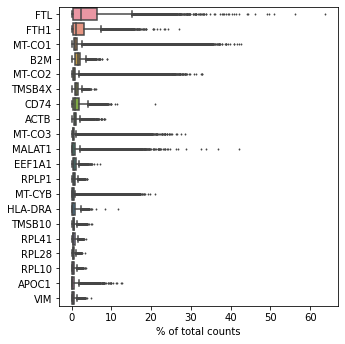

Running Scrublet
filtered out 8897 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:03)
extracting highly variable genes
    finished (0:00:17)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:01)
Embedding transcriptomes using PCA...
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 39.5%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 0.9%
    Scrublet finished (0:21:41)


... storing 'Sample' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


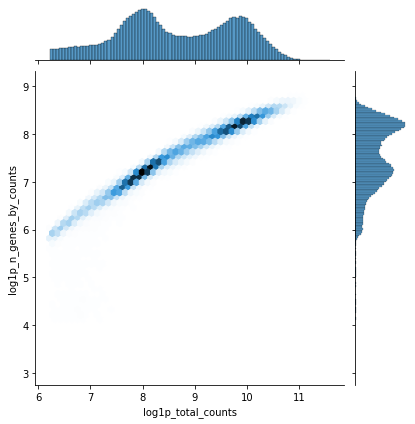

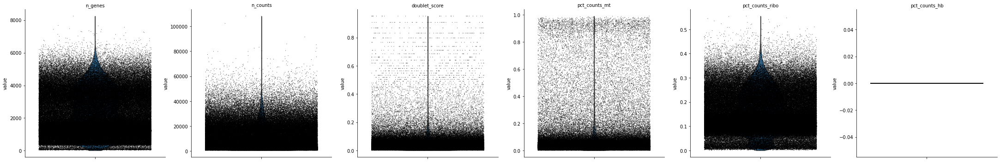

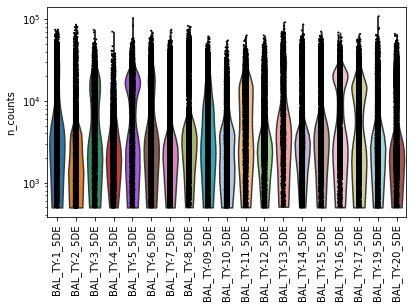

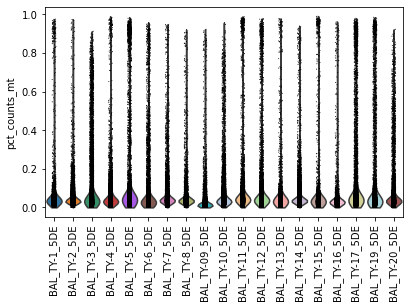

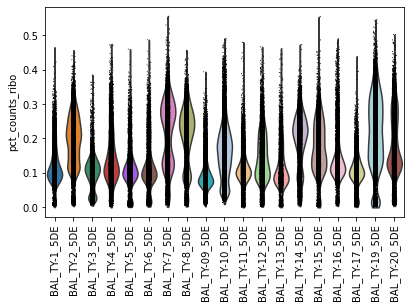

...

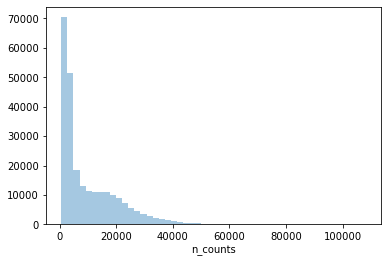

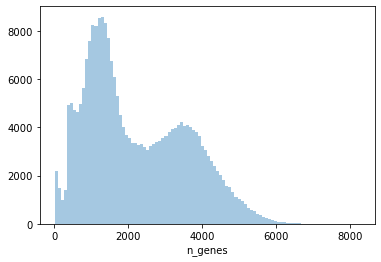

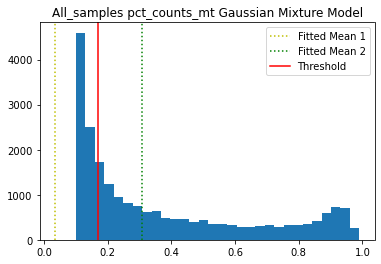

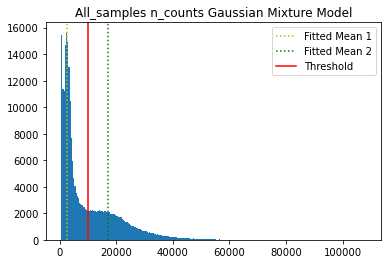

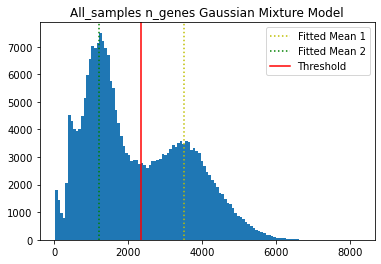

filtered out 0 cells that have less than 165 counts
filtered out 8897 genes that are detected in less than 3 cells
filtered out 8897 genes that are detected in less than 3 cells
filtered out 0 cells that have more than 51039299 counts
filtered out 14507 cells that has over 17% reads belong to mitochondrial genes
filtered out 87 cells that have less than 301 genes expressed


Trying to set attribute `.obs` of view, copying.


filtered out 87 cells that have less than 301 genes expressed
filtered out 838 cells that have over 5785 genes expressed


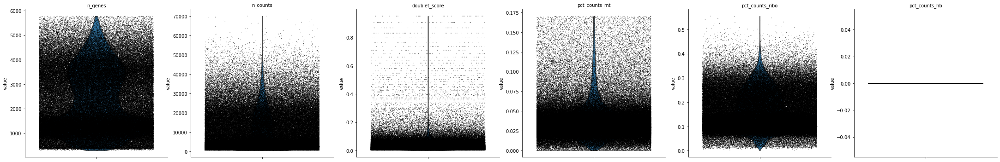

CPU times: user 29min 15s, sys: 1min 35s, total: 30min 50s
Wall time: 29min 25s


In [10]:
%%time
adata = sc_pipe.qc_and_preprocess(adata,out_path, multi_sample=True)

normalizing counts per cell
    finished (0:00:02)
normalizing counts per cell
    finished (0:00:04)


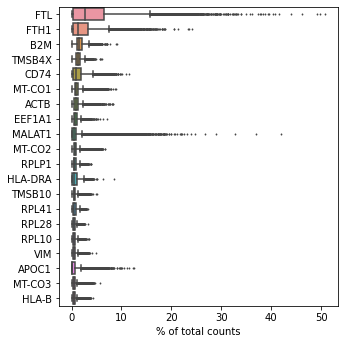

normalizing counts per cell
    finished (0:00:04)


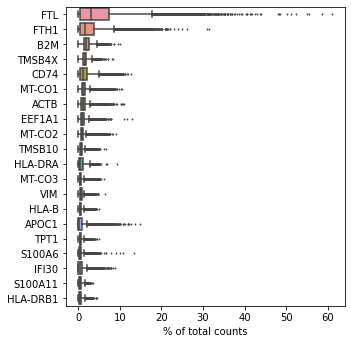

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:05)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


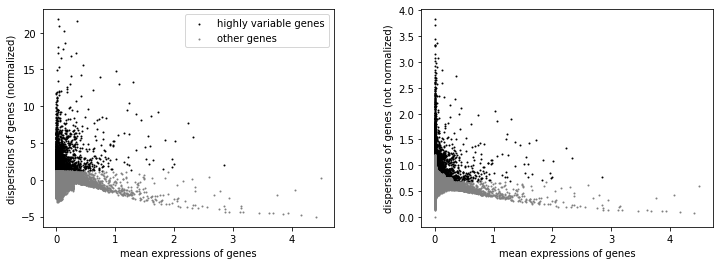

In [11]:
adata = sc_pipe.feature_selection(adata, out_path, exclude_genes)


In [12]:
adata

AnnData object with n_obs × n_vars = 234259 × 27210
    obs: 'Sample', 'batch', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'doublet_score', 'predicted_doublet', 'n_counts', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_colors', 'log1p', 'hvg'

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:37)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:08)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:18)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:03:43)
running Leiden clustering
    finished: found 25 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:15:18)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:30)
--> added 'pos', the PAGA positions (adata.uns['paga'])


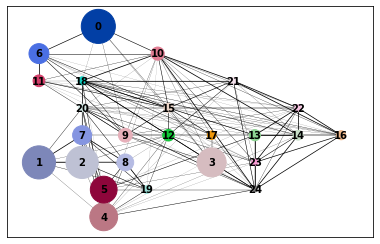

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:04:06)


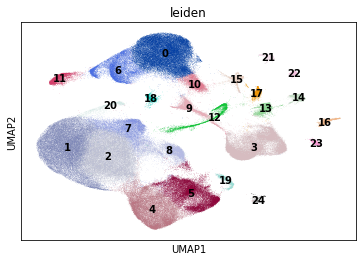

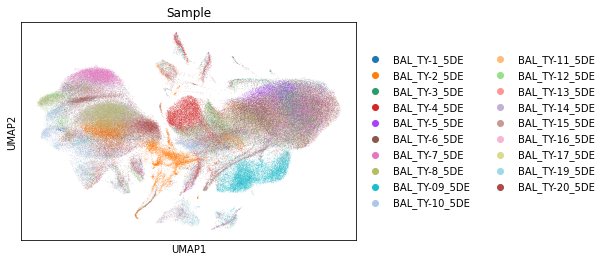

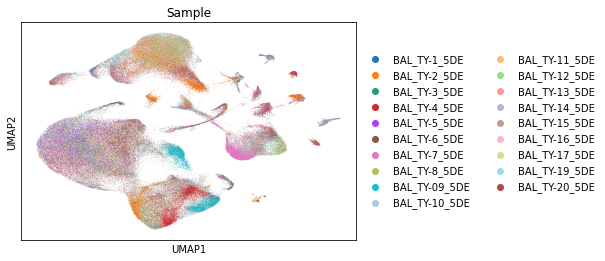

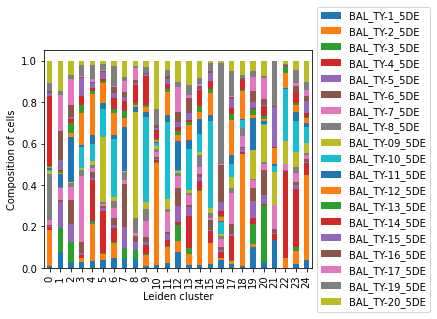

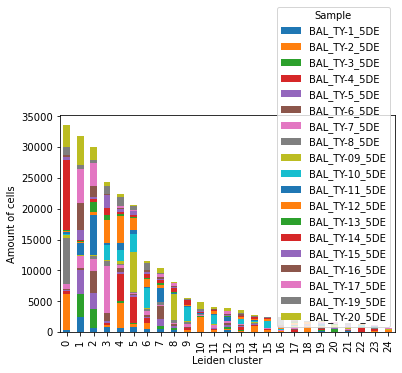

In [13]:
adata =  sc_pipe.BBKNN_clustering(adata,out_path, multi_sample=True, resol=1)
#adata = sc_pipe.clustering(adata,samples)

In [14]:
adata

AnnData object with n_obs × n_vars = 234259 × 27210
    obs: 'Sample', 'batch', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'doublet_score', 'predicted_doublet', 'n_counts', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'log_counts', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sample_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'leiden_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:03:21)


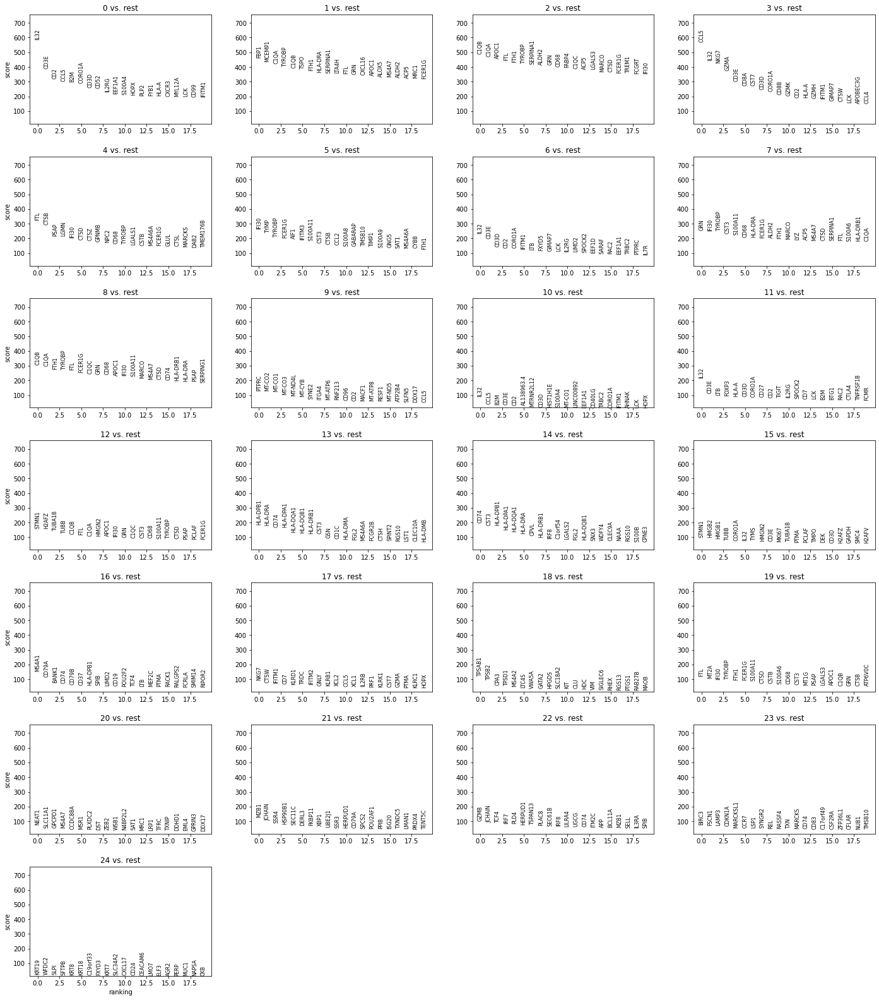

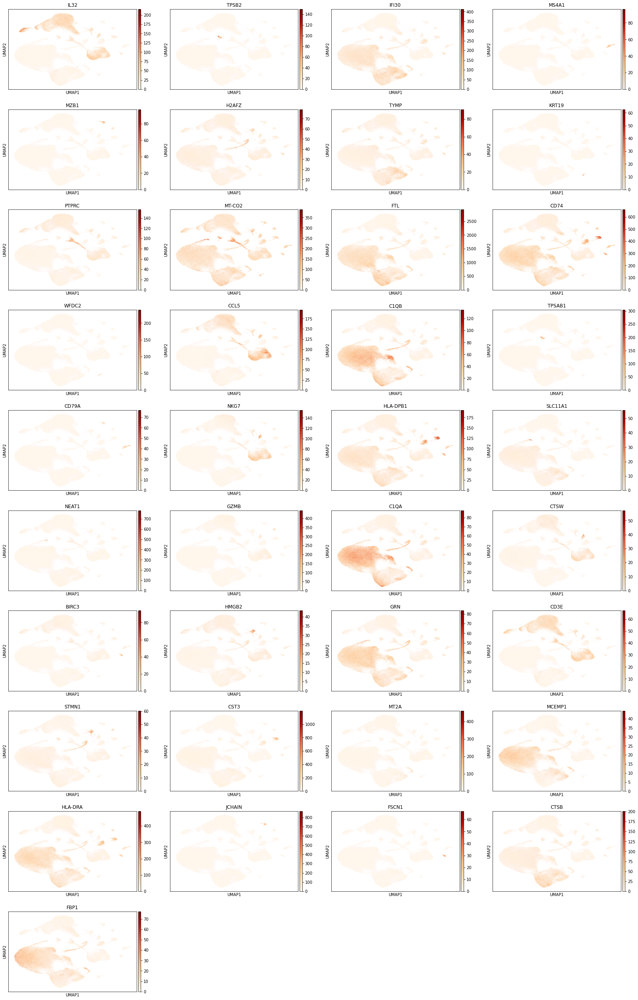

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


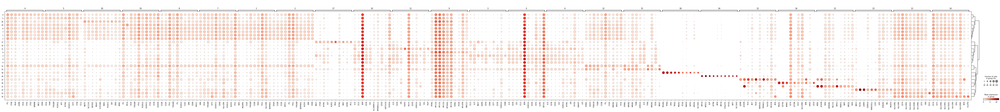

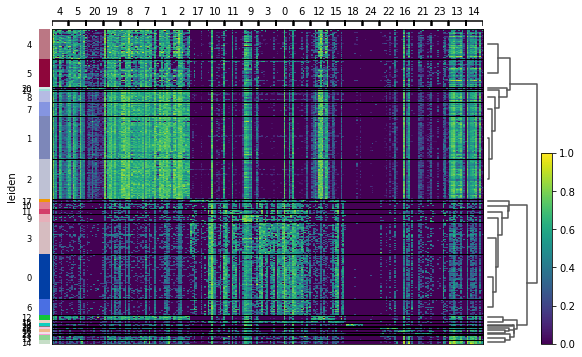

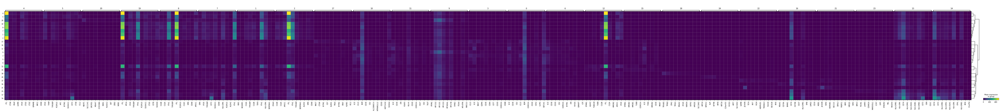

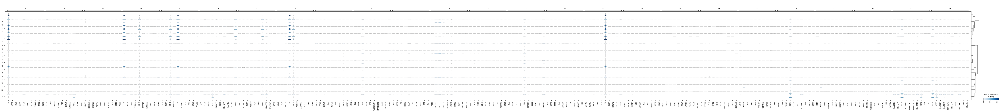

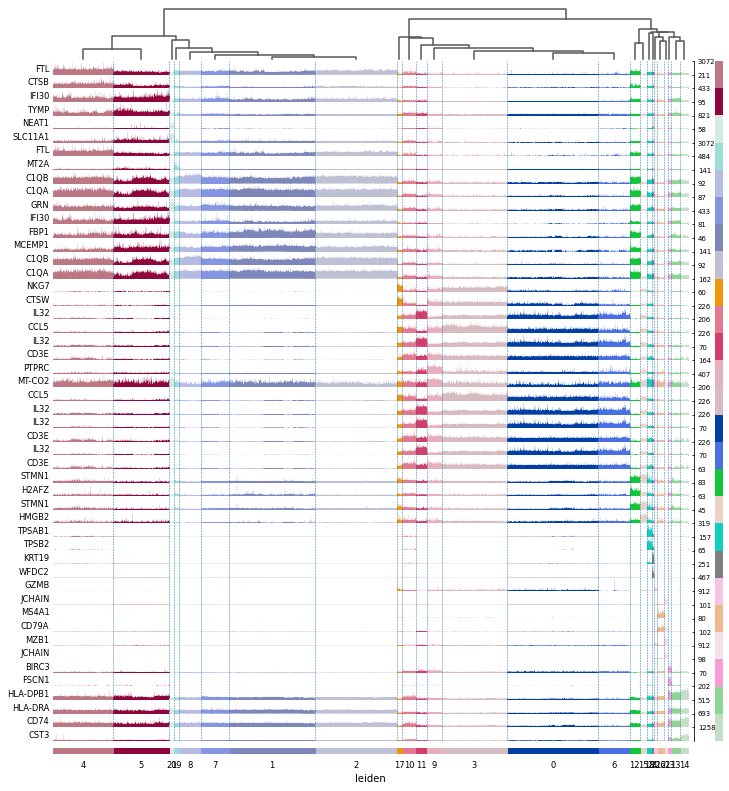

ranking genes
    finished: added to `.uns['rank_genes_samples']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:37)


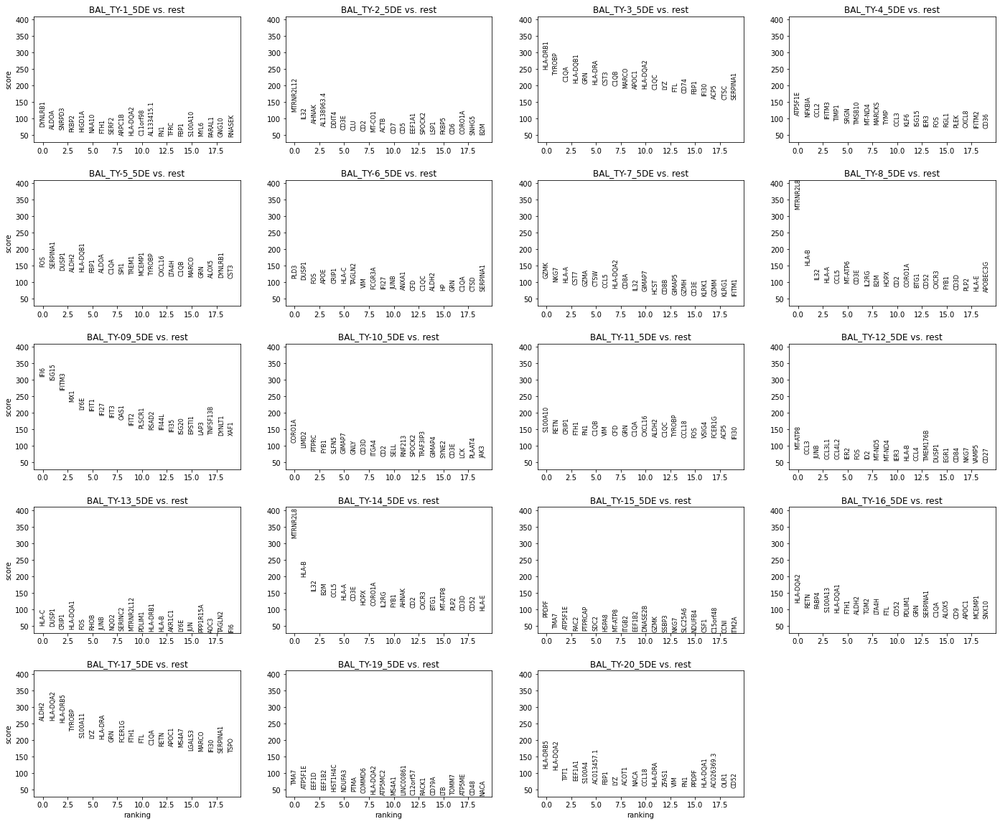

In [15]:
adata = sc_pipe.differential(adata,out_path, multi_sample = True)

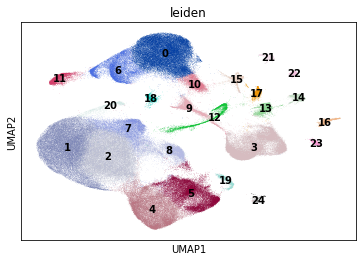

In [16]:
sc.pl.umap(adata, color='leiden',legend_loc='on data')

In [17]:
adata.write_h5ad(out_path+'/human_merged.h5ad')

In [26]:
adata=sc.read_h5ad(out_path+'/human_merged.h5ad')

running ingest
    finished (0:03:00)


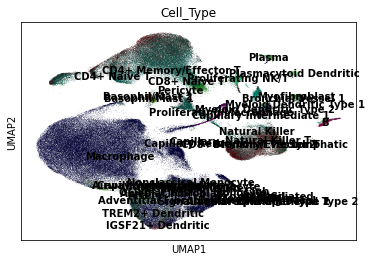

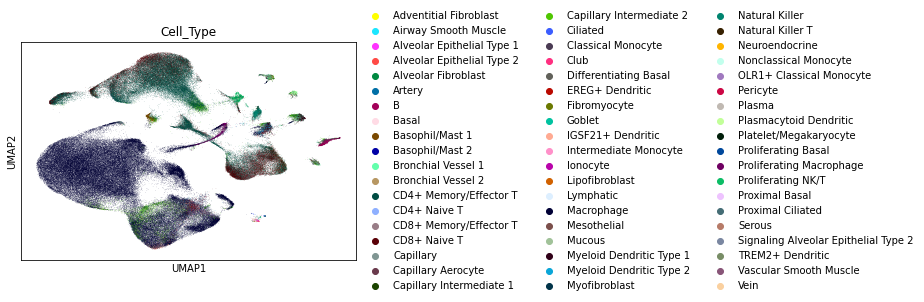

In [27]:
ad_ucsc=sc.read_h5ad('/user/ifrec/liuyuchen/Azimuth_ref/lung.h5ad')
ad_ingest = adata.copy()
var_names = ad_ucsc.var_names.intersection(ad_ingest.var_names)
ad_ucsc = ad_ucsc[:, var_names]
ad_ingest= ad_ingest[:, var_names]
sc.tl.ingest(ad_ingest, ad_ucsc, obs='Cell_Type')
adata.obs  = ad_ingest.obs
sc.pl.umap(adata, color='Cell_Type',legend_loc='on data')
sc.pl.umap(adata, color='Cell_Type')

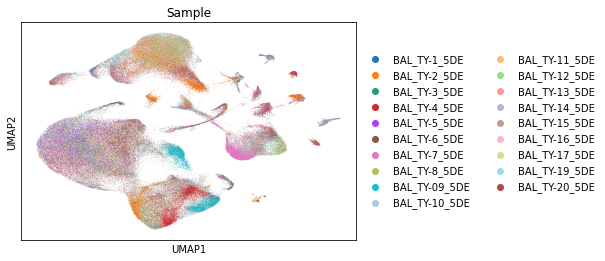

In [28]:
sc.pl.umap(adata, color='Sample')

In [29]:
adata.obs['Cell_Type'].value_counts()

Macrophage                              118098
CD4+ Memory/Effector T                   53900
CD8+ Naive T                             21955
Capillary Intermediate 2                  7820
CD8+ Memory/Effector T                    4774
Natural Killer                            3540
Capillary                                 3392
Natural Killer T                          3359
Myeloid Dendritic Type 1                  2393
Classical Monocyte                        2029
B                                         1753
Proliferating NK/T                        1601
Bronchial Vessel 1                        1582
Proliferating Macrophage                  1515
Basophil/Mast 1                           1046
Myeloid Dendritic Type 2                   922
EREG+ Dendritic                            825
IGSF21+ Dendritic                          750
Plasmacytoid Dendritic                     668
OLR1+ Classical Monocyte                   433
Club                                       325
TREM2+ Dendri

In [30]:
adata.obs.Sample.value_counts()

BAL_TY-2_5DE     17952
BAL_TY-14_5DE    17539
BAL_TY-10_5DE    17402
BAL_TY-7_5DE     16169
BAL_TY-20_5DE    15910
BAL_TY-12_5DE    15185
BAL_TY-11_5DE    14894
BAL_TY-09_5DE    13977
BAL_TY-4_5DE     12971
BAL_TY-17_5DE    11696
BAL_TY-8_5DE     11636
BAL_TY-19_5DE    10419
BAL_TY-6_5DE     10287
BAL_TY-5_5DE      9972
BAL_TY-3_5DE      9323
BAL_TY-16_5DE     8930
BAL_TY-1_5DE      8167
BAL_TY-15_5DE     7291
BAL_TY-13_5DE     4539
Name: Sample, dtype: int64

In [33]:
adata.obs.Sample=adata.obs.Sample.apply(lambda x: '_'.join(str(x).split('_')[:2]))

In [34]:
adata.obs.Sample.value_counts()

BAL_TY-2     17952
BAL_TY-14    17539
BAL_TY-10    17402
BAL_TY-7     16169
BAL_TY-20    15910
BAL_TY-12    15185
BAL_TY-11    14894
BAL_TY-09    13977
BAL_TY-4     12971
BAL_TY-17    11696
BAL_TY-8     11636
BAL_TY-19    10419
BAL_TY-6     10287
BAL_TY-5      9972
BAL_TY-3      9323
BAL_TY-16     8930
BAL_TY-1      8167
BAL_TY-15     7291
BAL_TY-13     4539
Name: Sample, dtype: int64

In [35]:
sub=adata[adata.obs['Sample'].isin([
    'BAL_TY-8',
'BAL_TY-19',
'BAL_TY-20',
'BAL_TY-1',
'BAL_TY-5',
'BAL_TY-7',
'BAL_TY-09',
'BAL_TY-4',
'BAL_TY-16',
'BAL_TY-13',
'BAL_TY-17'
])].copy()

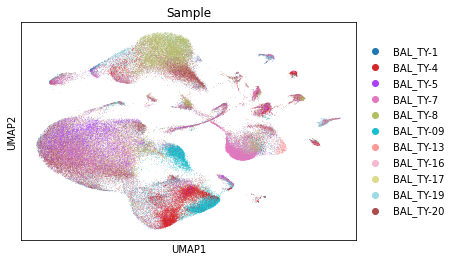

In [36]:
sc.pl.umap(sub, color='Sample')

In [38]:
sub.obs['condition'] = 'Progressive'
sub.obs.loc[adata.obs['Sample'].isin(['BAL_TY-09','BAL_TY-4']),'condition'] = 'Rapidly'

... storing 'condition' as categorical


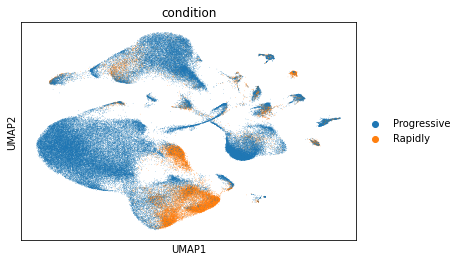

In [39]:
sc.pl.umap(sub, color='condition')

In [40]:
sub.write_h5ad(out_path+'/human_requested_samples.h5ad')